In [1]:
import torch
import torch.optim as optim
import numpy as np
import random
import time
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import LogNorm
import seaborn as sns
import pylab
import json
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)
random.seed(2023)
np.random.seed(2023)
torch.manual_seed(2023)

# random support from code

def transpose_trop_mult(a, b, args=False):
    # we calculate (ab)_{ij} = sum a_jk b_ik
    if a.shape[1] == b.shape[1]:
        if args:
            # We calculate c_{ijk} = a_{jk} + b_{ik}
            c = a[np.newaxis, :, :] + b[:, np.newaxis, :]
            # We find the maximal k
            index = np.nanargmax(c, axis=2)
            prod = np.array([[c[i, j, index[i, j]] for j in range(a.shape[0])] for i in range(b.shape[0])])
            return prod, index
        else:
            prod = np.nanmax(a[np.newaxis, :, :] + b[:, np.newaxis, :], axis=2)
            return prod
    else:
        print('Matrix shapes do not match')

def rand_supp(N, M):
    #Generating a random map
    permutation = np.random.permutation(range(N)).tolist()
    coords = list(range(M)) + list(np.random.choice(range(M), N-M))

    supp = [set() for n in range(M)]

    for n in range(N):
        supp[coords[n]].add(permutation[n])
    
    return supp

def SuppToMatrix(supp, N, M):
    Map = np.full((M, N), np.nan)
    for i in range(M):
        for j in supp[i]:
            Map[i, j] = 0
    return Map


##################################Pytorch Part
# my_inf = torch.const(-1e^11)
def trop_mul(a, supp, Mat):
    # this function returns the tropical multiplication of matrix
    M = len(supp)
    b = torch.zeros(M)
    for i in range(M):
        row_supp = sorted(supp[i])
        num_supp = len(row_supp)
        row = torch.zeros(num_supp)
        for j in range(num_supp):
            row[j] = Mat[row_supp[j]]+a[row_supp[j]]
        b[i] = torch.max(row)
    return b

# Define the objective function
def objective_function(X, Y, supp, Mat, p):
    # X is input data of dim N
    # Y is output data of dim M
    
    num_data = len(X)
    obj_func = 0
    
    for i in range(num_data):
        Z = Y[i,:]-trop_mul(X[i,:], supp, Mat)
        obj_func += torch.sum((torch.max(Z) - torch.min(Z))**p)/num_data
    
    return obj_func

# Define the objective function
def objective_function_infty(X, Y, supp, Mat):
    # X is input data of dim N
    # Y is output data of dim M
    
    num_data = len(X)
    obj_func = 0
    norms = torch.zeros(len(X))
    
    for i in range(num_data):
        Z = Y[i,:]-trop_mul(X[i,:], supp, Mat)
        norms[i] = (torch.max(Z) - torch.min(Z))
    obj_func = torch.max(norms)
    
    return obj_func

# Define the identity matrix w.r.t given supp
def IdProj(X, supp):
    M = len(supp)
    [n, N] = X.size()
    Y = torch.zeros(n, M)
    IdMat = torch.zeros(N)
    for i in range(n):
        Y[i,:] = trop_mul(X[i,:], supp, IdMat)
        
    return Y 

def trop_dist(x,y):

    return torch.max(x-y, dim=1).values - torch.min(x-y,dim=1).values

def trop_dist_1d(x,y):
    return torch.max(x-y) - torch.min(x-y)

In [2]:
# Defining projections for visualisations
def proj(X):
    proj_mat = torch.tensor([[1, -0.5, -0.5],[0, np.sqrt(3)/2, -np.sqrt(3)/2]],dtype = torch.double)
    return torch.matmul(proj_mat, X)/torch.sqrt(torch.tensor(1.5))

def rev_proj(X):
    rev_proj_mat = torch.tensor([[1, 0],[-1/2, np.sqrt(3)/2],[-1/2, -np.sqrt(3)/2]],dtype = torch.double)
    return torch.t(torch.matmul(rev_proj_mat, X)/torch.sqrt(torch.tensor(1.5)))

# Tropical Statistics

In [15]:
#Defining Steepest Descent function
def id(i, norm):
    return i + 1

def SD(loss_fn, t, lr, num_steps, tol_loss, tol_t, step_size = id, grad = "T2", termination = True):
    N = len(t.data)
    steps = num_steps

    loss_values = []
    t_values = []

    if grad in ["Adam", "TropAdam"]:
        optimizer = optim.Adam([t], lr=lr)
    elif grad in ["Adamax"]:
        optimizer = optim.Adamax([t], lr=lr)
    elif grad in ["TropAdamax"]:
        optimizer = optim.Adamax([t], lr=2*lr)
    if grad in ["TropicalAdam"]:
        m = torch.zeros(N)
        u = torch.zeros(N)
        
    # Perform gradient descent
    for i in range(num_steps):

        loss = loss_fn(t)
        loss_values.append(loss.item())
        t_values.append(t.detach().clone().numpy())
        loss.backward()
        
        #step direction computation
        if not torch.nonzero(t.grad.data).numel():
            steps = i
            break
        elif grad in ["L2", "T1"]:
            if grad == "L2":
                step = (t.grad.data)/torch.linalg.norm(t.grad.data, ord = 2)
                norm = torch.linalg.norm(t.grad.data, ord = 2)
            elif grad == "T1":
                step = (t.grad.data > 0).float()
                norm = torch.max(t.grad.data) - torch.min(t.grad.data)
            t.data = t.data - lr * step * step_size(i, norm)
        elif grad in ["Adam", "Adamax", "SGD"]:
            optimizer.step()
        elif grad == "TropicalAdam":
            t.grad.data = (t.grad.data > 0).float() * (torch.max(t.grad.data) - torch.min(t.grad.data))
            m = beta[0] * m + (1-beta[0])*t.grad.data
            u = torch.maximum(beta[1]*u, t.grad.data) #beta[1]*u + (1-beta[1])*(torch.max(t.grad.data) - torch.min(t.grad.data))
            step = (2*lr/(1-beta[0]**(i+1)))*torch.div(m,u + 10e-8)
            t.data = t.data - step
            u = u - torch.min(u)
        elif grad in ["TropAdam", "TropAdamax"]:
            t.grad.data = (t.grad.data > 0).float() * (torch.max(t.grad.data) - torch.min(t.grad.data))
            optimizer.step()
        t.grad.data.zero_()

        #convergence tests
        if i>5 and termination:
            if (np.abs(loss_values[-1] - loss_values[-4]) < tol_loss):
                steps = i
                break
#              if np.ptp(t_values[-1]-t_values[-5]) < 3*lr/num_steps:
#                 steps = i
#                 break
            
    return steps, loss_values, t_values

In [16]:
#Calculating objective plot
def objective(loss_fn, resolution = 100, scale = 5, shift = 10, plot = False, logplot = False, save_plot = False, Stats_Prob = 'WDDD'):
    Objective = np.zeros([resolution,resolution])

    for t1 in range(resolution):
        for t2 in range(resolution):

            Objective[t1,t2] = loss_fn(rev_proj(torch.tensor([t1/scale-shift, t2/scale-shift],dtype = torch.double)))

    if plot:
        #Plotting steepest descent for p=2 optimiser
        fig, ax = plt.subplots(1,1, figsize=(6,5))
        fig.tight_layout()

        if logplot:
            sns.heatmap(np.transpose(np.log(Objective)), cmap = 'jet', ax=ax, yticklabels = np.linspace(resolution/scale - shift, (resolution)/scale + shift,10))
        else:
            sns.heatmap(np.transpose(Objective), cmap = 'jet', ax=ax, yticklabels = np.linspace(resolution/scale - shift, (resolution)/scale + shift,10))
        ax.axes.invert_yaxis()
        ax.set_xticks(range(0,100,10))
        ax.set_xticklabels(f'{c}' for c in np.arange(-10,10,2))
        ax.set_yticks(range(0,100,10))
        ax.set_yticklabels(f'{c}' for c in np.arange(-10,10,2))
        #sns.scatterplot(x=5*(proj(-np.transpose(X))[0]+20), y=5*(proj(-np.transpose(X))[1]+20))

        if save_plot:
            plt.savefig('Figures/%s_Visualisation_2.png' %Stats_Prob)
        
    return Objective

In [17]:
#Running steepest descent for p=2 optimiser
def run_SD(loss_fn, t_dim = 3, iter_count = 25, grad_types = ["L1", "L2", "T1", "T2"], termination = True):
    t_values = []
    loss_values = []
    steps = np.zeros((iter_count,len(grad_types)))

    for i in range(iter_count):
        t_init = torch.randn(t_dim, dtype=torch.double)*20
        i_loss_vals = [[]]*len(grad_types)
        i_t_vals = [[]]*len(grad_types)

        print(i)

        for grad_index, grad in enumerate(grad_types):
            GD_t = t_init.clone().detach().requires_grad_(True)
            if grad in ["Adam", "Adamax", "TropAdamax"]:
                steps[i,grad_index],i_loss_vals[grad_index],i_t_vals[grad_index] = SD(loss_fn, GD_t, Adam_lr, Adam_num_steps, tol_loss, tol_t, step_size=step_size, grad = grad, termination=termination)
            elif grad in ["L2", "T1"]:
                steps[i,grad_index],i_loss_vals[grad_index],i_t_vals[grad_index] = SD(loss_fn, GD_t, Descent_lr, Descent_num_steps, tol_loss, tol_t, step_size=step_size, grad = grad, termination=termination)

        loss_values.append(i_loss_vals)
        t_values.append(i_t_vals)
        
    return loss_values, t_values, steps

In [18]:
#Plotting steepest descent for optimiser
def plot_SD(t_values, Objective, grad_types = ["L1", "L2", "T1", "T2"], logplot = False, save_plot = False):
    grad_count = len(grad_types)

    fig, ax = plt.subplots(1,grad_count, figsize=(5*grad_count,5))
    fig.tight_layout()

    for i in range(grad_count):

        if logplot:
            sns.heatmap(np.transpose(np.log(Objective[0:100,0:100])), cmap = 'jet', ax=ax[i])
        else:
            sns.heatmap(np.transpose(Objective[0:100,0:100]), cmap = 'jet', ax=ax[i])
        ax[i].axes.invert_yaxis()
        ax[i].set_xticks(range(0,100,10))
        ax[i].set_xticklabels(f'{c}' for c in np.arange(-10,10,2))
        ax[i].set_yticks(range(0,100,10))
        ax[i].set_yticklabels(f'{c}' for c in np.arange(-10,10,2))

    for i in range(5):
        for j in range(grad_count):
            t_Values = proj(torch.tensor(np.transpose(t_values[i][j]),dtype = torch.double))
            sns.scatterplot(x = (10+t_Values[0,:])*5, y = (t_Values[1,:]+10)*5, s=10, ax = ax[j])

    if save_plot:
        plt.savefig('Figures/%s_Visualisation_2.png' %Stats_Prob)

In [19]:
#Fill data
def fill_data(data, length = 200):
    for i in range(len(data)):
        for j in range(len(data[i])):
            data[i][j] += [data[i][j][-1]]*(length - len(data[i][j]))

In [20]:
#Plotting histogram of converged value
def loss_hist_plot(loss_values, grad_types, num_steps, min = 0, iter_list = [10, 50, 100, 500, 1000,1500, 2000,2500], save_plot = False, save_name = "Adam"):
    grad_count = len(grad_types)
    
    iter_list = [a for a in iter_list if (a <= num_steps) ]

    fig, axs = plt.subplots(grad_count,len(iter_list), figsize = (5*len(iter_list),5*grad_count))
    fig.tight_layout()
    ax = fig.add_subplot(111,frameon=False)
    plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
    plt.grid(False)
    plt.xlabel("%s Loss value"%Stats_Prob,fontsize = 35)

    axislims = np.max(np.max(loss_values, axis = 0), axis = 0)
    bin_width = (axislims - min)/50

    for i in range(len(iter_list)):
            axs[0,i].set_title(f"After {iter_list[i]} Steps",fontsize = 30)
            for j in range(grad_count):
                    axs[j,i].hist(loss_values[:,j,iter_list[i]-1], bins = list(np.arange(min,axislims[iter_list[i]-1]+1,bin_width[iter_list[i]-1])))
                    axs[j,i].set_xlim([min,axislims[iter_list[i]-1]])
                    axs[j,i].set_ylim([0,num_exps])
                    axs[j,i].tick_params(axis='x', labelsize=18)
                    axs[j,i].tick_params(axis='y', labelsize=18)

    for j, grad_type in enumerate(grad_types):
        axs[j,0].set_ylabel((grad_type+" Descent Freq"),fontsize = 25)

    fig.tight_layout()

    #axs[len(iter_list)-1].legend(prop={'size':20})
    
    if save_plot:
        plt.savefig('Figures/%s%s_Loss_Histogram_2.png' %(Stats_Prob,save_name))

In [30]:
#Logplot of error for successful iterations
def log_error_plot(loss_values, grad_types, num_steps, global_solution, successes = None, save_plot = False, nbhd = False, save_name = "Adam"):
    
    log_loss_values = np.log(np.array(loss_values - global_solution*0.99)) - np.log(global_solution*0.99)
    if successes is None:
        mean_log_loss_values = np.mean(log_loss_values,axis = 0)
        std_log_loss_values = np.std(log_loss_values,axis = 0)
    else:
        mean_log_loss_values = np.mean(log_loss_values,axis = 0, where=np.repeat(successes[:,:,np.newaxis], num_iter, axis = 2))
        std_log_loss_values = np.std(log_loss_values,axis = 0, where=np.repeat(successes[:,:,np.newaxis], num_iter, axis = 2))

    grad_count = len(grad_types)
    fig, axs = plt.subplots(1,grad_count, figsize = (8*grad_count,8))
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    ax = fig.add_subplot(111,frameon=False)
    plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
    plt.title("Minimizing %s Loss"%Stats_Prob,fontsize = 35)
    
    yrange = [np.min(log_loss_values), np.max(log_loss_values)]
    
    for j, grad_type in enumerate(grad_types):
        axs[j].plot(range(0,num_steps,10), mean_log_loss_values[j,:num_steps:10], "blue", linewidth = 2.5)
        for i in range(50):
            axs[j].plot(range(0,num_steps,10), log_loss_values[i,j,:num_steps:10], "k", linewidth = 0.1)
        axs[j].grid()
        axs[j].set_ylim(yrange)
        axs[j].set_xlabel('Step Count', fontsize = 25)
        axs[j].set_ylabel('%s Log Relative Error' %grad_type, fontsize = 25)
            
    fig.tight_layout()
    
    if save_plot and nbhd:
        pylab.savefig('Figures/%s_Error_plot/%s%s_Nbhd_Log_Error_plot.png'%(save_name,Stats_Prob,save_name))
    elif save_plot and not nbhd:
        pylab.savefig('Figures/%s_Error_plot/%s%s_Log_Error_plot.png'%(save_name,Stats_Prob,save_name))


In [22]:
#Running steepest descent in small neighbourhood
def run_nbhd_SD(loss_fn, approx_optimum, scale = 0.05, t_dim = 3, iter_count = 25, grad_types = ["L1", "L2", "T1", "T2"], termination = True):
    t_values = []
    loss_values = []
    steps = np.zeros((iter_count,len(grad_types)))

    for i in range(iter_count):
        t_init = torch.rand(t_dim, dtype=torch.double)*scale
        i_loss_vals = [[]]*len(grad_types)
        i_t_vals = [[]]*len(grad_types)

        print(i)

        for grad_index, grad in enumerate(grad_types):
            GD_t = t_init.clone().detach().requires_grad_(True)
            if grad in ["Adam", "Adamax", "TropAdamax"]:
                steps[i,grad_index],i_loss_vals[grad_index],i_t_vals[grad_index] = SD(loss_fn, GD_t, Adam_lr*scale, Adam_num_steps, tol_loss, tol_t, step_size=step_size, grad = grad, termination=termination)
            elif grad in ["L2", "T1"]:
                steps[i,grad_index],i_loss_vals[grad_index],i_t_vals[grad_index] = SD(loss_fn, GD_t, Descent_lr*scale, Descent_num_steps, tol_loss, tol_t, step_size=step_size, grad = grad, termination=termination)
        loss_values.append(i_loss_vals)
        t_values.append(i_t_vals)
        
    return loss_values, t_values, steps

In [23]:
#Run experiments

def run_experiments(loss_fn, t_dim, Stats_Prob, grad_types = ["L1", "L2", "T1", "T2"], objective_vis = True, plot_SD_vis = True, plot_loss_hist = True, plot_log_error = True, termination = True):

    if t_dim == 3 and objective_vis:
        Objective = objective(loss_fn, plot = True, Stats_Prob=Stats_Prob, save_plot = True)
        
    #Running steepest descent for p=2 optimiser
    loss_values, t_values, steps = run_SD(loss_fn, t_dim=t_dim, iter_count = num_exps, grad_types=grad_types, termination=termination)

    print("SD ran")

    print("mean steps: ", np.mean(steps,axis=0))
    print("std steps: ", np.std(steps,axis=0))
    fill_data(loss_values, np.max((Adam_num_steps, Descent_num_steps)))
    global_solution = np.min(loss_values)
    successes = np.array(loss_values)[:,:,-1] < global_solution + 5*tol_loss
    convergence = np.zeros((num_exps,len(grad_types)))
    convergence[:,:2] = np.array(steps)[:,:2] < Descent_num_steps - 5
    convergence[:,2:] = np.array(steps)[:,2:] < Adam_num_steps - 5
    print("convergence count: ", np.sum(convergence,axis=0))
    print("success count: ", np.sum(successes,axis=0))
    print(global_solution)

    #Plotting steepest descent for p=2 optimiser
    if t_dim == 3 and plot_SD_vis:
        plot_SD(t_values, Objective, grad_types=grad_types)
        
    fill_data(t_values, np.max((Adam_num_steps, Descent_num_steps)))
    index = np.unravel_index(np.argmin(np.array(loss_values)), np.array(loss_values).shape)
    approx_optimum = np.array(t_values)[index[0], index[1], index[2], :]
        
    return loss_values, t_values, steps, global_solution, approx_optimum

In [1]:
#Plotting experiment results
def plotting(loss_values, global_solution, num_steps, grad_types = ["Adam", "Adamax", "TropAdamax"], plot_loss_hist = False, plot_log_error = True, save_name = "Adam"):
    
    if plot_loss_hist:
        loss_hist_plot(np.array(loss_values), grad_types, num_steps, min = global_solution - 5*tol_loss, save_plot = True, save_name = save_name)

    if plot_log_error:
        log_error_plot(loss_values, grad_types, num_steps, global_solution, save_plot = True, save_name = save_name)

In [25]:
# Running experiments from a small neighbourhood of the optimum
def convergence_experiment(loss_fn, t_dim, Stats_Prob, approx_optimum, grad_types = ["L1", "L2", "T1", "T2"]):

    nbhd_loss_values, nbhd_t_values, nbhd_steps = run_nbhd_SD(loss_fn, approx_optimum, scale = 0.05, t_dim=t_dim, iter_count = num_exps, grad_types=grad_types, termination=False)
    global_solution = np.min(nbhd_loss_values)
    
    fill_data(nbhd_loss_values, num_steps)        
    log_error_plot(nbhd_loss_values, grad_types, global_solution, save_plot = True, nbhd = True)
    
    fill_data(t_values, num_steps)
    index = np.unravel_index(np.argmin(np.array(loss_values)), np.array(loss_values).shape)
    approx_optimum = np.array(t_values)[index[0], index[1], index[2], :]
    
    return nbhd_loss_values, nbhd_t_values, nbhd_steps, global_solution, approx_optimum

## Fermat Weber Means

In [89]:
#Setting hyperparameters, generating and plotting data

random.seed(2023)
np.random.seed(2023)
torch.manual_seed(2023)

Stats_Prob = "FW"
num_exps = 50 # number of experiments
n = 50 # number of data
N = 10 # input dimension
Adam_lr = 0.5
Descent_lr = 5
beta = (0.9,0.999)
Adam_num_steps = 500
Descent_num_steps = 1000
tol_loss = 1e-4
tol_t = 1e-5
t_dim = N
def step_size(i, norm):
    return norm /torch.sqrt(torch.tensor(i+1))

X = torch.randn(n,N)*10

def loss_fn(t):
    return torch.sum(trop_dist(X,t))/n

In [20]:
# Calculating p=2 objective
tic = time.time()
FW_loss_values, FW_t_values, FW_steps, FW_global_solution, FW_approx_optimum = run_experiments(loss_fn, 
                                                                                               t_dim, 
                                                                                               "FW", 
                                                                                               grad_types = ["L2", "T1","Adam", "Adamax", "TropAdamax"])

print(time.time() - tic)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
SD ran
mean steps:  [414.12 260.48 115.5  138.5  173.74]
std steps:  [142.71084612  81.69681512  24.5888186   34.55676489  57.45252301]
convergence count:  [50. 50. 50. 50. 50.]
success count:  [32  9 27 33 20]
31.4704946899414
12.664988279342651


In [92]:
# Calculating p=2 objective
tic = time.time()
FW_loss_values_uncut, FW_t_values_uncut, FW_steps_uncut, FW_global_solution_uncut, FW_approx_optimum_uncut = run_experiments(loss_fn, 
                                                                                                                             t_dim, 
                                                                                                                             "FW", 
                                                                                                                             grad_types = ["L2", "T1","Adam", "Adamax", "TropAdamax"], 
                                                                                                                             termination = False)

print(time.time() - tic)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
SD ran
mean steps:  [1000. 1000.  500.  500.  500.]
std steps:  [0. 0. 0. 0. 0.]
convergence count:  [0. 0. 0. 0. 0.]
success count:  [50 50 35 50 50]
31.470494689941397
37.23584198951721


In [21]:
np.save("FW/loss_values",np.asarray(FW_loss_values))
np.save("FW/t_values",np.asarray(FW_t_values))
np.save("FW/steps",np.asarray(FW_steps))
np.save("FW/global_solution",np.asarray(FW_global_solution))
np.save("FW/approx_optimum",np.asarray(FW_approx_optimum))

In [93]:
np.save("FW/loss_values_uncut",np.asarray(FW_loss_values_uncut))
np.save("FW/t_values_uncut",np.asarray(FW_t_values_uncut))
np.save("FW/steps_uncut",np.asarray(FW_steps_uncut))
np.save("FW/global_solution_uncut",np.asarray(FW_global_solution_uncut))
np.save("FW/approx_optimum_uncut",np.asarray(FW_approx_optimum_uncut))

In [65]:
FW_loss_values = np.load("FW/loss_values.npy")
FW_t_values = np.load("FW/t_values.npy")
FW_steps = np.load("FW/steps.npy")
FW_global_solution = np.load("FW/global_solution.npy")
FW_approx_optimum = np.load("FW/approx_optimum.npy")

In [79]:
FW_loss_values_uncut = np.load("FW/loss_values_uncut.npy")
FW_t_values_uncut = np.load("FW/t_values_uncut.npy")
FW_steps_uncut = np.load("FW/steps_uncut.npy")
FW_global_solution_uncut = np.load("FW/global_solution_uncut.npy")
FW_approx_optimum_uncut = np.load("FW/approx_optimum_uncut.npy")

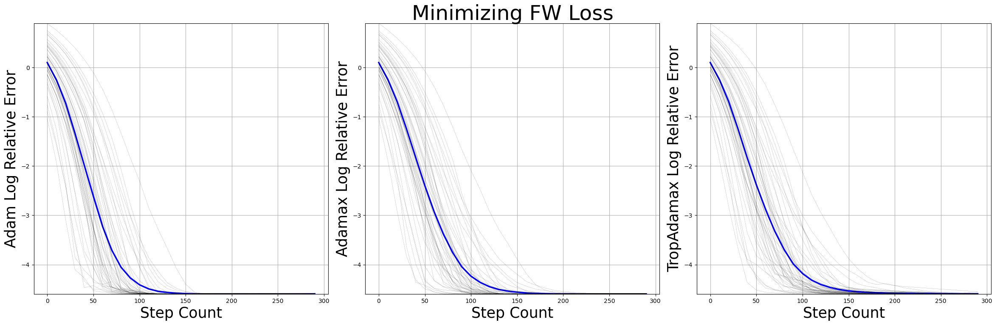

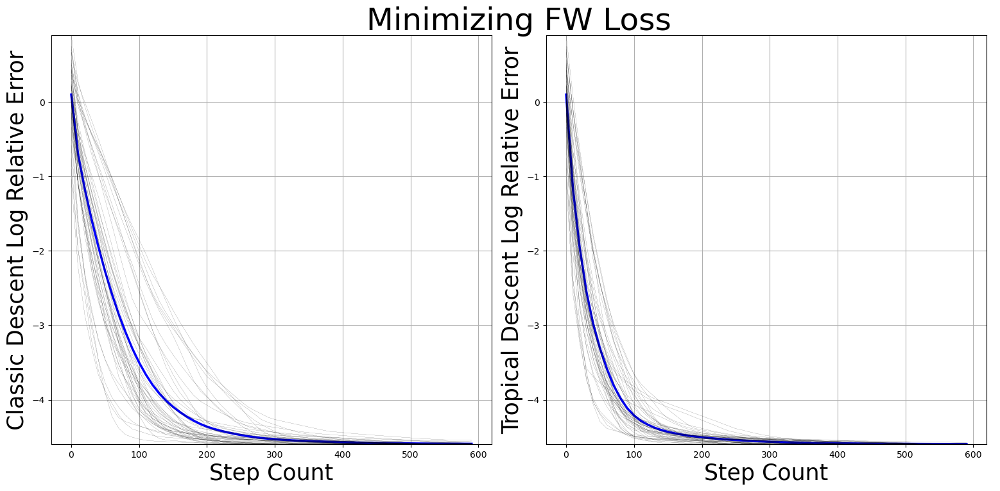

In [80]:
Stats_Prob = "FW"
tol_loss = 1e-4
num_exps = 50
Adam_num_steps = 300
Descent_num_steps = 600
plotting(FW_loss_values_uncut[:,2:], FW_global_solution_uncut, Adam_num_steps)
plotting(FW_loss_values_uncut[:,:2], FW_global_solution_uncut, Descent_num_steps, grad_types = ["Classic Descent", "Tropical Descent"], save_name = "Descent")

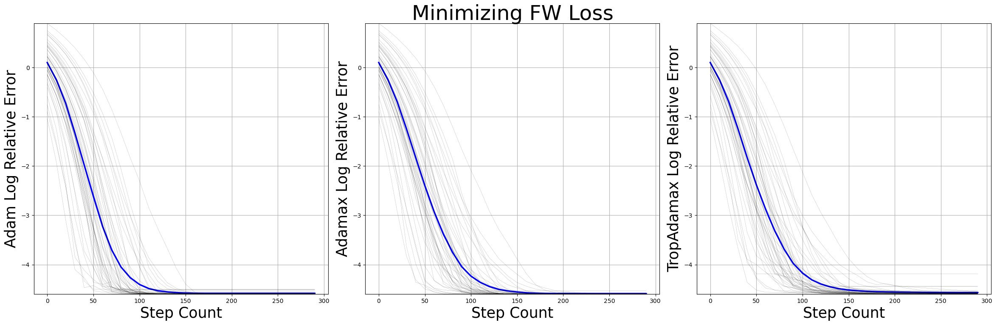

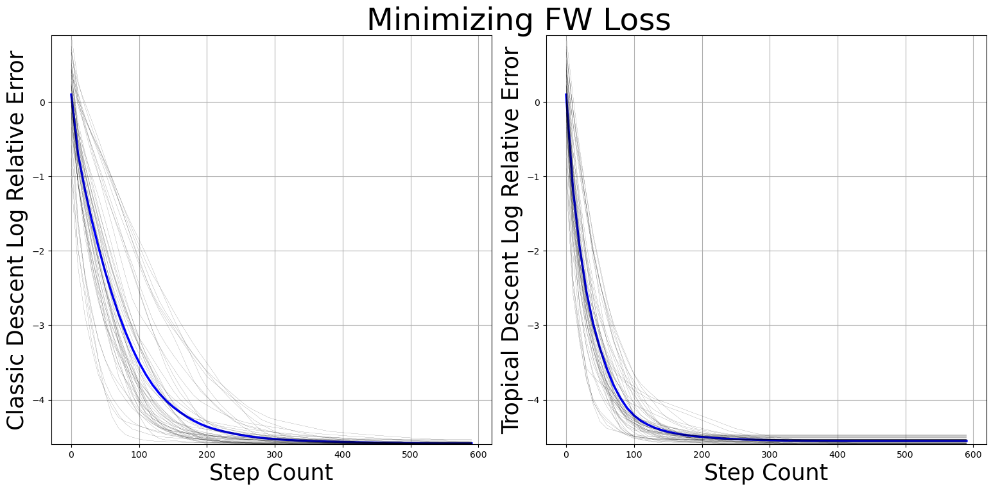

In [66]:
Stats_Prob = "FW"
tol_loss = 1e-4
num_exps = 50
Adam_num_steps = 300
Descent_num_steps = 600
plotting(FW_loss_values[:,2:], FW_global_solution, Adam_num_steps)
plotting(FW_loss_values[:,:2], FW_global_solution, Descent_num_steps, grad_types = ["Classic Descent", "Tropical Descent"], save_name = "Descent")

## Frechet Means

In [98]:
#Setting hyperparameters, generating and plotting data
Stats_Prob = "FM"
num_exps = 50 # number of experiments
n = 50 # number of data
N = 10 # input dimension
Adam_lr = 0.5
Descent_lr = 5
beta = (0.9,0.999)
Adam_num_steps = 500
Descent_num_steps = 1000
tol_loss = 1e-4
tol_t = 1e-5
t_dim = N
def step_size(i, norm):
    return norm / torch.sqrt(torch.tensor(i+1))

X = torch.randn(n,N)*10

def loss_fn(t):
    return torch.sqrt(torch.sum(trop_dist(X,t)**2)/n)

In [23]:
# Calculating p=2 objective
tic = time.time()
FM_loss_values, FM_t_values, FM_steps, FM_global_solution, FM_approx_optimum = run_experiments(loss_fn, 
                                                                                               t_dim, 
                                                                                               "FM", 
                                                                                               grad_types = ["L2", "T1", "Adam", "Adamax", "TropAdamax"])

print(time.time() - tic)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
SD ran
mean steps:  [333.56 185.62 118.8  141.38 149.1 ]
std steps:  [85.30865372 37.40154542 24.85880126 33.71521318 34.77829783]
convergence count:  [50. 50. 50. 50. 50.]
success count:  [0 0 0 0 0]
30.308109717901132
11.877814531326294


In [99]:
# Calculating p=2 objective
tic = time.time()
FM_loss_values_uncut, FM_t_values_uncut, FM_steps_uncut, FM_global_solution_uncut, FM_approx_optimum_uncut = run_experiments(loss_fn, 
                                                                                               t_dim, 
                                                                                               "FM", 
                                                                                               grad_types = ["L2", "T1", "Adam", "Adamax", "TropAdamax"], termination = False)

print(time.time() - tic)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
SD ran
mean steps:  [1000. 1000.  500.  500.  500.]
std steps:  [0. 0. 0. 0. 0.]
convergence count:  [0. 0. 0. 0. 0.]
success count:  [12  0  0  3  0]
30.307642869605644
42.31122827529907


In [24]:
np.save("FM/loss_values",np.asarray(FM_loss_values))
np.save("FM/t_values",np.asarray(FM_t_values))
np.save("FM/steps",np.asarray(FM_steps))
np.save("FM/global_solution",np.asarray(FM_global_solution))
np.save("FM/approx_optimum",np.asarray(FM_approx_optimum))

In [100]:
np.save("FM/loss_values_uncut",np.asarray(FM_loss_values_uncut))
np.save("FM/t_values_uncut",np.asarray(FM_t_values_uncut))
np.save("FM/steps_uncut",np.asarray(FM_steps_uncut))
np.save("FM/global_solution_uncut",np.asarray(FM_global_solution_uncut))
np.save("FM/approx_optimum_uncut",np.asarray(FM_approx_optimum_uncut))

In [67]:
FM_loss_values = np.load("FM/loss_values.npy")
FM_t_values = np.load("FM/t_values.npy")
FM_steps = np.load("FM/steps.npy")
FM_global_solution = np.load("FM/global_solution.npy")
FM_approx_optimum = np.load("FM/approx_optimum.npy")

In [81]:
FM_loss_values_uncut = np.load("FM/loss_values_uncut.npy")
FM_t_values_uncut = np.load("FM/t_values_uncut.npy")
FM_steps_uncut = np.load("FM/steps_uncut.npy")
FM_global_solution_uncut = np.load("FM/global_solution_uncut.npy")
FM_approx_optimum_uncut = np.load("FM/approx_optimum_uncut.npy")

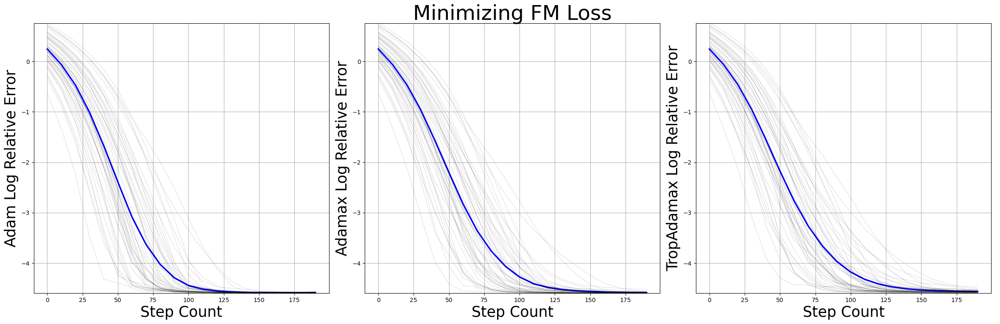

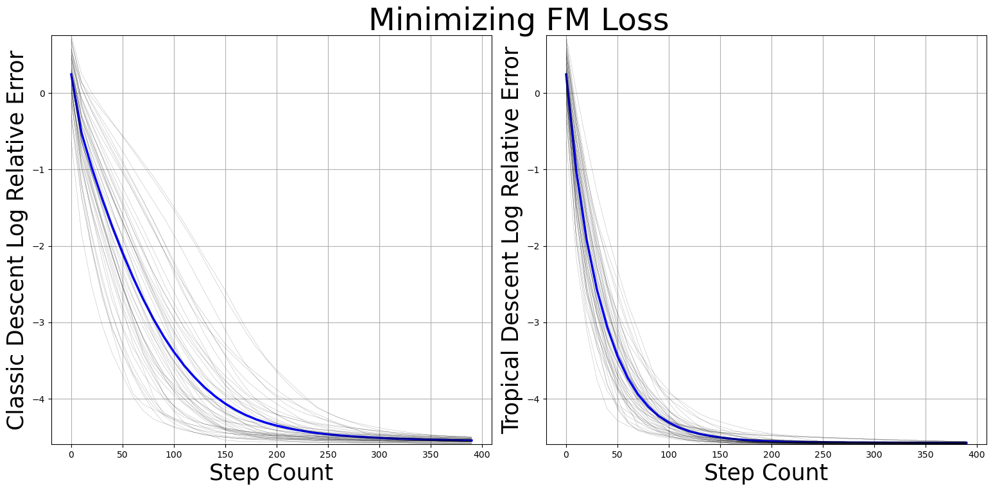

In [82]:
Stats_Prob = "FM"
Adam_num_steps = 200
Descent_num_steps = 400
plotting(FM_loss_values_uncut[:, 2:], FM_global_solution_uncut, Adam_num_steps)
plotting(FM_loss_values_uncut[:, :2], FM_global_solution_uncut, Descent_num_steps, grad_types = ["Classic Descent", "Tropical Descent"], save_name = "Descent")

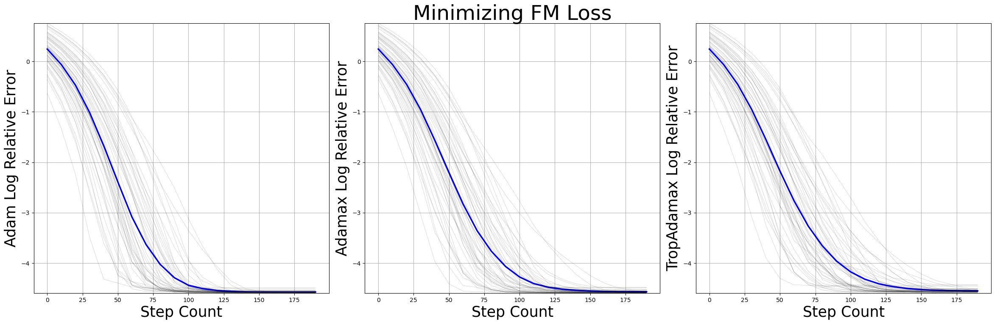

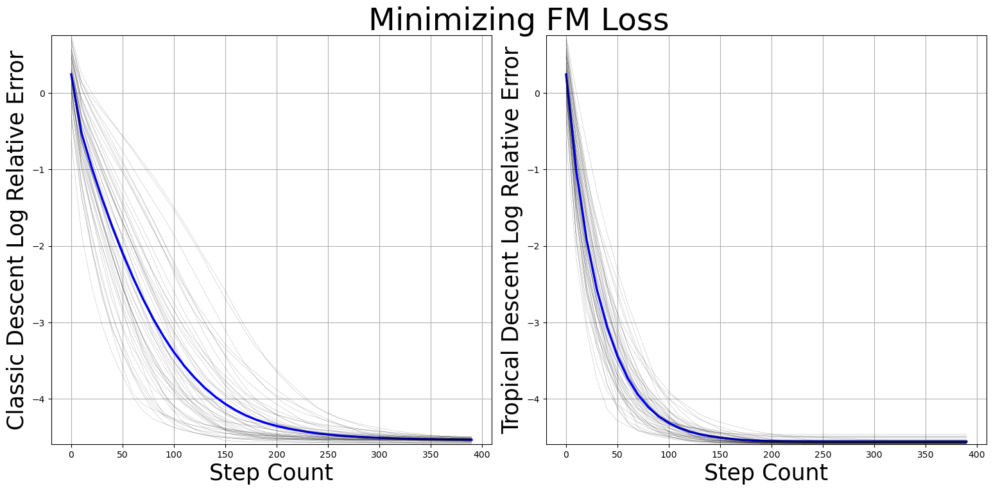

In [68]:
Stats_Prob = "FM"
Adam_num_steps = 200
Descent_num_steps = 400
plotting(FM_loss_values[:, 2:], FM_global_solution, Adam_num_steps)
plotting(FM_loss_values[:, :2], FM_global_solution, Descent_num_steps, grad_types = ["Classic Descent", "Tropical Descent"], save_name = "Descent")

## WDDD2

In [133]:
#Setting hyperparameters, generating and plotting data

random.seed(2023)
np.random.seed(2023)
torch.manual_seed(2023)

Stats_Prob = "WD2"
num_exps = 50 # number of experiments
n = 50 # number of data
N = 10 # input dimension
M = 8
Adam_lr = 0.5
Descent_lr = 5
beta = (0.9,0.999)
Adam_num_steps = 500
Descent_num_steps = 1000
tol_loss = 1e-4
tol_t = 1e-5
t_dim = N
def step_size(i, norm):
    return norm /torch.sqrt(torch.tensor(i+1))

supp = rand_supp(N, M)
X = torch.randn(n, N)*10
Y = IdProj(X, supp)

def loss_fn(t):
    return torch.sqrt(objective_function(X,Y,supp, t, p = 2))

In [15]:
#Calculating p=2 objective
tic = time.time()
WD2_loss_values, WD2_t_values, WD2_steps, WD2_global_solution, WD2_approx_optimum = run_experiments(loss_fn, 
                                                                                                    t_dim, 
                                                                                                    "WD2", 
                                                                                                    grad_types = ["L2", "T1", "Adam", "Adamax", "TropAdamax"])

print(time.time() - tic)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
SD ran
mean steps:  [1701.8  1096.2  1263.2   553.2  1319.32]
std steps:  [1020.16990742  704.69644529  727.41245521  474.10163467  794.10521822]
convergence count:  [20. 47. 42. 49. 39.]
success count:  [0 0 0 0 0]
0.013001915067434311
11934.978970527649


In [134]:
#Calculating p=2 objective
tic = time.time()
WD2_loss_values_uncut, WD2_t_values_uncut, WD2_steps_uncut, WD2_global_solution_uncut, WD2_approx_optimum_uncut = run_experiments(loss_fn, 
                                                                                                    t_dim, 
                                                                                                    "WD2", 
                                                                                                    grad_types = ["L2", "T1", "Adam", "Adamax", "TropAdamax"],
                                                                                                   termination = False)

print(time.time() - tic)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
SD ran
mean steps:  [1000. 1000.  500.  500.  500.]
std steps:  [0. 0. 0. 0. 0.]
convergence count:  [0. 0. 0. 0. 0.]
success count:  [0 0 0 0 0]
0.016593780368566513
6799.810640573502


In [16]:
np.save("WD2/loss_values",np.asarray(WD2_loss_values))
np.save("WD2/t_values",np.asarray(WD2_t_values))
np.save("WD2/steps",np.asarray(WD2_steps))
np.save("WD2/global_solution",np.asarray(WD2_global_solution))
np.save("WD2/approx_optimum",np.asarray(WD2_approx_optimum))

In [135]:
np.save("WD2/loss_values_uncut",np.asarray(WD2_loss_values_uncut))
np.save("WD2/t_values_uncut",np.asarray(WD2_t_values_uncut))
np.save("WD2/steps_uncut",np.asarray(WD2_steps_uncut))
np.save("WD2/global_solution_uncut",np.asarray(WD2_global_solution_uncut))
np.save("WD2/approx_optimum_uncut",np.asarray(WD2_approx_optimum_uncut))

In [83]:
WD2_loss_values_uncut = np.load("WD2/loss_values_uncut.npy")
WD2_t_values_uncut = np.load("WD2/t_values_uncut.npy")
WD2_steps_uncut = np.load("WD2/steps_uncut.npy")
WD2_global_solution_uncut = np.load("WD2/global_solution_uncut.npy")
WD2_approx_optimum_uncut = np.load("WD2/approx_optimum_uncut.npy")

In [69]:
WD2_loss_values = np.load("WD2/loss_values.npy")
WD2_t_values = np.load("WD2/t_values.npy")
WD2_steps = np.load("WD2/steps.npy")
WD2_global_solution = np.load("WD2/global_solution.npy")
WD2_approx_optimum = np.load("WD2/approx_optimum.npy")

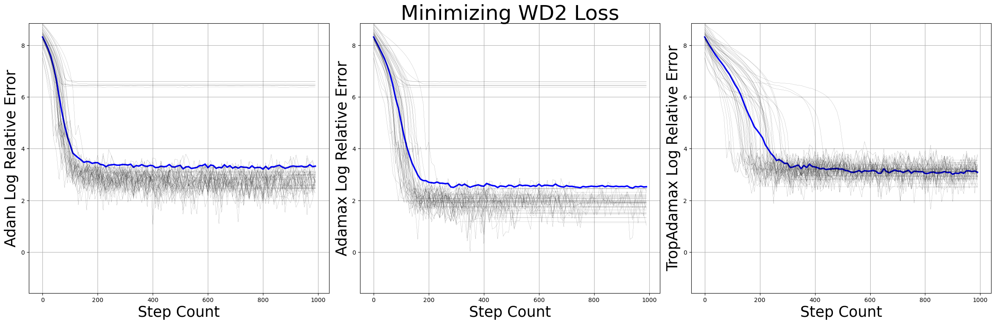

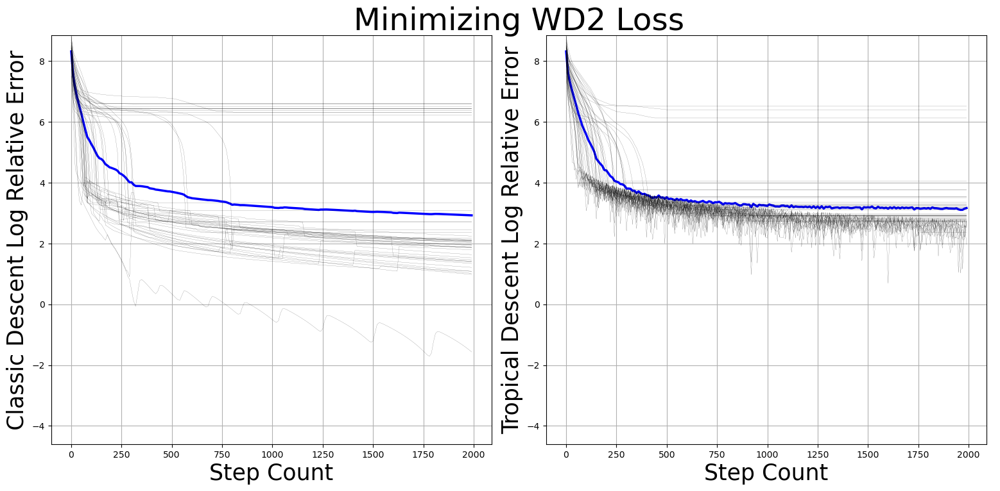

In [70]:
Stats_Prob = "WD2"
Adam_num_steps = 1000
Descent_num_steps = 2000
plotting(WD2_loss_values[:,2:], WD2_global_solution, Adam_num_steps)
plotting(WD2_loss_values[:,:2], WD2_global_solution, Descent_num_steps, grad_types = ["Classic Descent", "Tropical Descent"], save_name = "Descent")

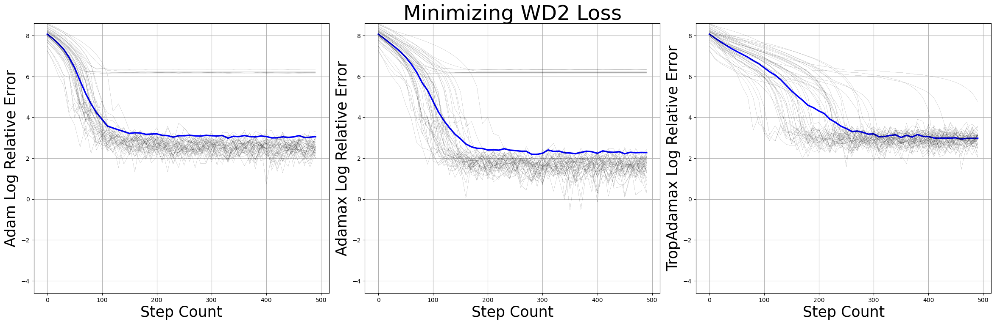

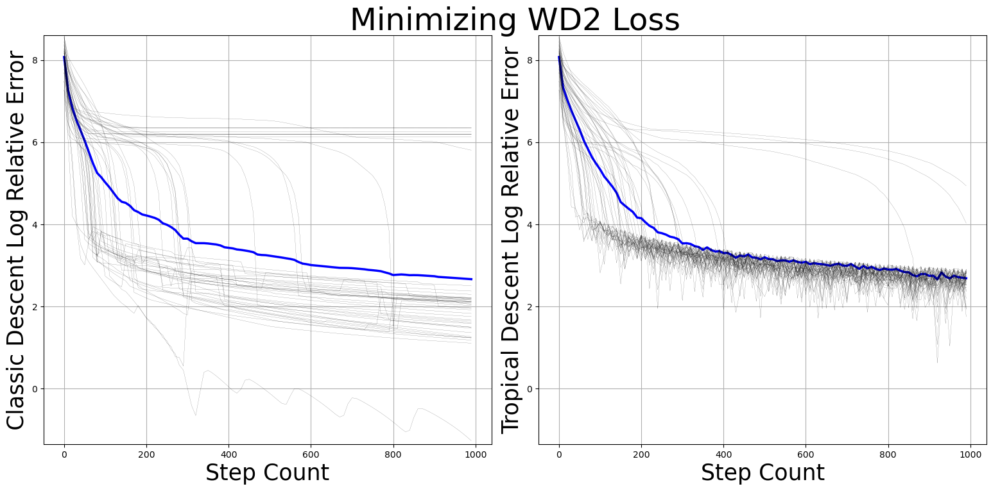

In [84]:
Stats_Prob = "WD2"
Adam_num_steps = 500
Descent_num_steps = 1000
plotting(WD2_loss_values_uncut[:,2:], WD2_global_solution_uncut, Adam_num_steps, save_name = "Adam")
plotting(WD2_loss_values_uncut[:,:2], WD2_global_solution_uncut, Descent_num_steps, grad_types = ["Classic Descent", "Tropical Descent"], save_name = "Descent")

## WDDDinf

In [128]:
#Setting hyperparameters, generating and plotting data
random.seed(2023)
np.random.seed(2023)
torch.manual_seed(2023)

Stats_Prob = "WDinf"
num_exps = 50 # number of experiments
n = 50 # number of data
N = 10 # input dimension
M = 8
Adam_lr = 0.5
Descent_lr = 5
beta = (0.9,0.999)
Adam_num_steps = 500
Descent_num_steps = 1000
tol_loss = 1e-4
tol_t = 1e-5
t_dim = N
def step_size(i, norm):
    return norm /torch.sqrt(torch.tensor(i+1))

supp = rand_supp(N, M)
X = torch.randn(n, N)*10
Y = IdProj(X, supp)

def loss_fn(t):
    return objective_function_infty(X,Y,supp, t)

In [18]:
#Calculating p=2 objective
tic = time.time()
WDinf_loss_values, WDinf_t_values, WDinf_steps, WDinf_global_solution, WDinf_approx_optimum = run_experiments(loss_fn, 
                                                                                                              t_dim, 
                                                                                                              "WDinf", 
                                                                                                              grad_types = ["L2", "T1", "Adam", "Adamax", "TropAdamax"])

print(time.time() - tic)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
SD ran
mean steps:  [1118.34  697.42  783.24  641.72  780.12]
std steps:  [462.91695195 449.15530009 299.42902732 294.82978411 275.12758059]
convergence count:  [27. 44. 23. 38. 26.]
success count:  [0 0 0 0 0]
0.03267383575439453
7465.300346136093


In [129]:
#Calculating p=2 objective
tic = time.time()
WDinf_loss_values_uncut, WDinf_t_values_uncut, WDinf_steps_uncut, WDinf_global_solution_uncut, WDinf_approx_optimum_uncut = run_experiments(loss_fn, 
                                                                                                              t_dim, 
                                                                                                              "WDinf", 
                                                                                                              grad_types = ["L2", "T1", "Adam", "Adamax", "TropAdamax"],
                                                                                                             termination = False)

print(time.time() - tic)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
SD ran
mean steps:  [1000. 1000.  500.  500.  500.]
std steps:  [0. 0. 0. 0. 0.]
convergence count:  [0. 0. 0. 0. 0.]
success count:  [0 0 0 0 0]
0.03682708740234375
6375.7385239601135


In [54]:
np.save("WDinf/loss_values",np.asarray(WDinf_loss_values))
np.save("WDinf/t_values",np.asarray(WDinf_t_values))
np.save("WDinf/steps",np.asarray(WDinf_steps))
np.save("WDinf/global_solution",np.asarray(WDinf_global_solution))
np.save("WDinf/approx_optimum",np.asarray(WDinf_approx_optimum))

NameError: name 'WDinf_loss_values' is not defined

In [130]:
np.save("WDinf/loss_values_uncut",np.asarray(WDinf_loss_values_uncut))
np.save("WDinf/t_values_uncut",np.asarray(WDinf_t_values_uncut))
np.save("WDinf/steps_uncut",np.asarray(WDinf_steps_uncut))
np.save("WDinf/global_solution_uncut",np.asarray(WDinf_global_solution_uncut))
np.save("WDinf/approx_optimum_uncut",np.asarray(WDinf_approx_optimum_uncut))

In [71]:
WDinf_loss_values = np.load("WDinf/loss_values.npy")
WDinf_t_values = np.load("WDinf/t_values.npy")
WDinf_steps = np.load("WDinf/steps.npy")
WDinf_global_solution = np.load("WDinf/global_solution.npy")
WDinf_approx_optimum = np.load("WDinf/approx_optimum.npy")

In [85]:
WDinf_loss_values_uncut = np.load("WDinf/loss_values_uncut.npy")
WDinf_t_values_uncut = np.load("WDinf/t_values_uncut.npy")
WDinf_steps_uncut = np.load("WDinf/steps_uncut.npy")
WDinf_global_solution_uncut = np.load("WDinf/global_solution_uncut.npy")
WDinf_approx_optimum_uncut = np.load("WDinf/approx_optimum_uncut.npy")

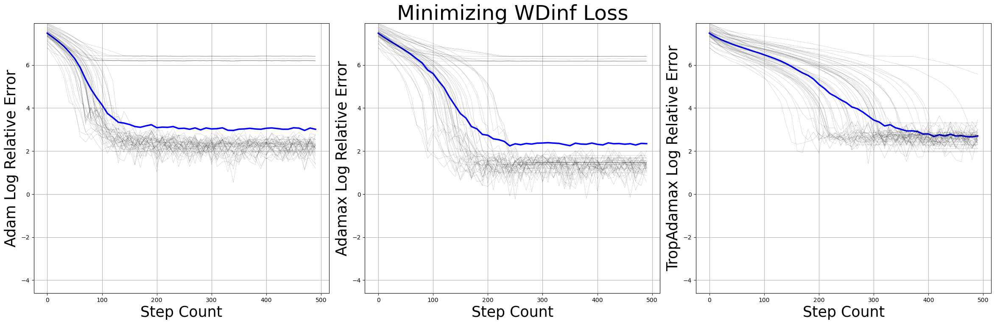

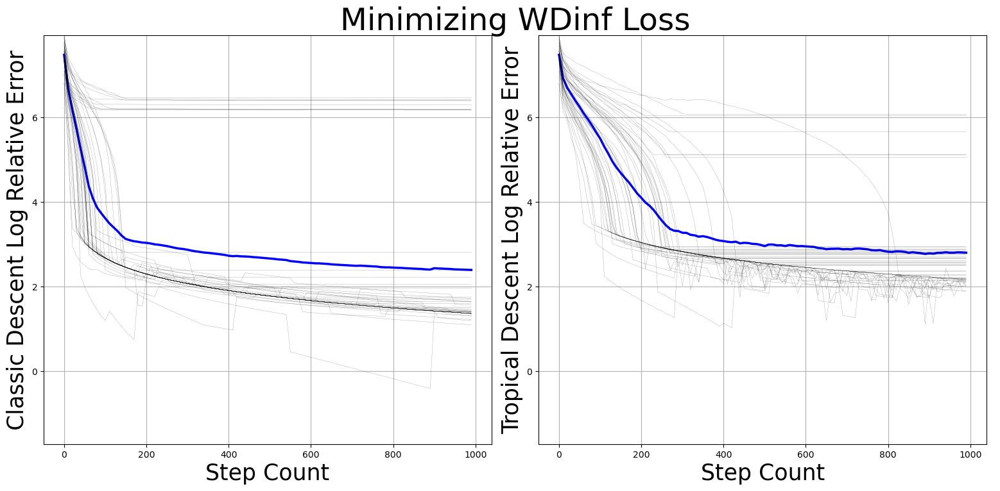

In [72]:
Stats_Prob = "WDinf"
Adam_num_steps = 500
Descent_num_steps = 1000
plotting(WDinf_loss_values[:, 2:], WDinf_global_solution, Adam_num_steps)
plotting(WDinf_loss_values[:, :2], WDinf_global_solution, Descent_num_steps, grad_types = ["Classic Descent", "Tropical Descent"], save_name = "Descent")

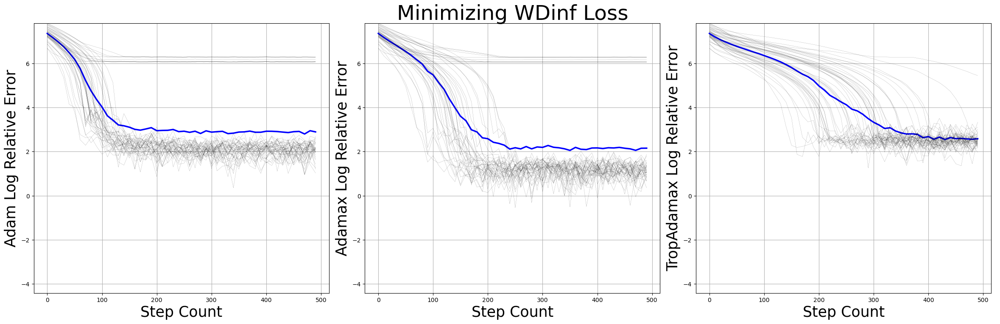

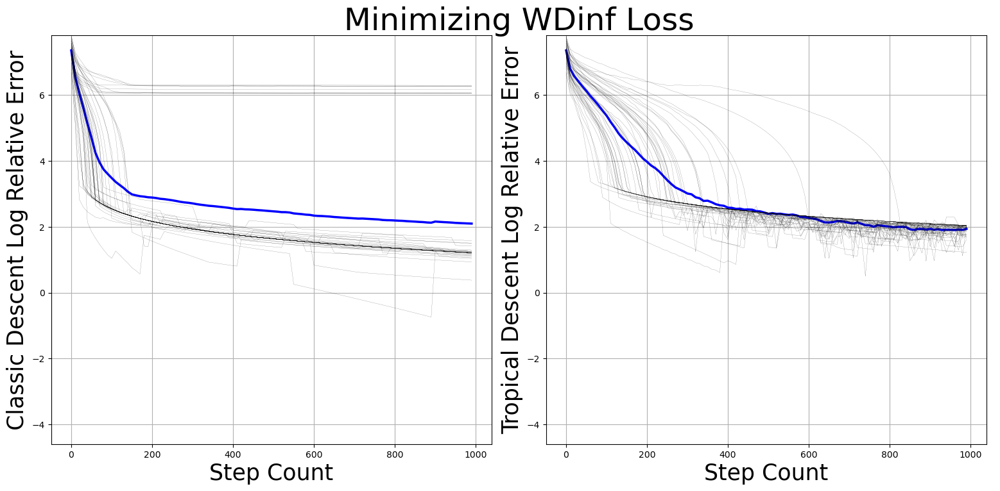

In [86]:
Stats_Prob = "WDinf"
Adam_num_steps = 500
Descent_num_steps = 1000
plotting(WDinf_loss_values_uncut[:, 2:], WDinf_global_solution_uncut, Adam_num_steps)
plotting(WDinf_loss_values_uncut[:, :2], WDinf_global_solution_uncut, Descent_num_steps, grad_types = ["Classic Descent", "Tropical Descent"], save_name = "Descent")

## Tropical Polytope PCA

In [113]:
#Setting hyperparameters, generating and plotting data
random.seed(2023)
np.random.seed(2023)
torch.manual_seed(2023)

Stats_Prob = "PCA"
num_exps = 50 # number of experiments
n = 50 # number of data
N = 10 # input dimension
Adam_lr = 0.5
Descent_lr = 5
beta = (0.9,0.999)
Adam_num_steps = 1000
Descent_num_steps = 1500
tol_loss = 1e-4
tol_t = 1e-5
t_dim = 3*N
def step_size(i, norm):
    return norm /torch.sqrt(torch.tensor(i+1))

X = torch.randn(n,N)*10

def PCA_objective(D1, D2, D3, X):

    D1 = torch.flatten(D1)

    n = len(X)
    d = len(D1)
    proj_u = torch.zeros(n,d)

    l = torch.empty([3,n])

    l[0,:] = torch.min(X-D1, dim = 1).values
    l[1,:] = torch.min(X-D2, dim = 1).values
    l[2,:] = torch.min(X-D3, dim = 1).values

    sum = 0

    for k in range(n):

        proj_u[k] = torch.maximum(l[0,k] + D1, torch.maximum(l[1,k] + D2, l[2,k] + D3))

    return torch.sum(trop_dist(proj_u, X))/n

def loss_fn(t):
    return PCA_objective(t[:N], t[N:2*N],t[2*N:], X)

In [129]:
#Calculating p=2 objective
tic = time.time()
PCA_loss_values, PCA_t_values, PCA_steps, PCA_global_solution, PCA_approx_optimum = run_experiments(loss_fn, 
                                                                                                    t_dim, 
                                                                                                    "PCA", 
                                                                                                    grad_types = ["L2", "T1", "Adam", "Adamax", "TropAdamax"])

print(time.time() - tic)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
SD ran
mean steps:  [1159.96  517.42  119.6   138.84  238.76]
std steps:  [507.20346844 297.45830565  33.11857485  50.89532788 105.9789715 ]
convergence count:  [43. 50. 50. 50. 50.]
success count:  [0 0 0 0 0]
23.02069664001465
863.7570912837982


In [114]:
#Calculating p=2 objective
tic = time.time()
PCA_loss_values_uncut, PCA_t_values_uncut, PCA_steps_uncut, PCA_global_solution_uncut, PCA_approx_optimum_uncut = run_experiments(loss_fn, 
                                                                                                    t_dim, 
                                                                                                    "PCA", 
                                                                                                    grad_types = ["L2", "T1", "Adam", "Adamax", "TropAdamax"],
                                                                                                   termination = False)

print(time.time() - tic)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
SD ran
mean steps:  [1469.44 1456.12  685.18  455.48  919.36]
std steps:  [ 98.2755636  143.37372702 406.27796839 410.58150178 221.92023432]
convergence count:  [ 6.  5. 20. 32.  7.]
success count:  [0 0 0 0 1]
22.91777801513672
1862.260633468628


In [177]:
np.save("PCA/loss_values",np.asarray(PCA_loss_values))
np.save("PCA/t_values",np.asarray(PCA_t_values))
np.save("PCA/steps",np.asarray(PCA_steps))
np.save("PCA/global_solution",np.asarray(PCA_global_solution))
np.save("PCA/approx_optimum",np.asarray(PCA_approx_optimum))

In [115]:
np.save("PCA/loss_values_uncut",np.asarray(PCA_loss_values_uncut))
np.save("PCA/t_values_uncut",np.asarray(PCA_t_values_uncut))
np.save("PCA/steps_uncut",np.asarray(PCA_steps_uncut))
np.save("PCA/global_solution_uncut",np.asarray(PCA_global_solution_uncut))
np.save("PCA/approx_optimum_uncut",np.asarray(PCA_approx_optimum_uncut))

In [73]:
PCA_loss_values = np.load("PCA/loss_values.npy")
PCA_t_values = np.load("PCA/t_values.npy")
PCA_steps = np.load("PCA/steps.npy")
PCA_global_solution = np.load("PCA/global_solution.npy")
PCA_approx_optimum = np.load("PCA/approx_optimum.npy")

In [87]:
PCA_loss_values_uncut = np.load("PCA/loss_values_uncut.npy")
PCA_t_values_uncut = np.load("PCA/t_values_uncut.npy")
PCA_steps_uncut = np.load("PCA/steps_uncut.npy")
PCA_global_solution_uncut = np.load("PCA/global_solution_uncut.npy")
PCA_approx_optimum_uncut = np.load("PCA/approx_optimum_uncut.npy")

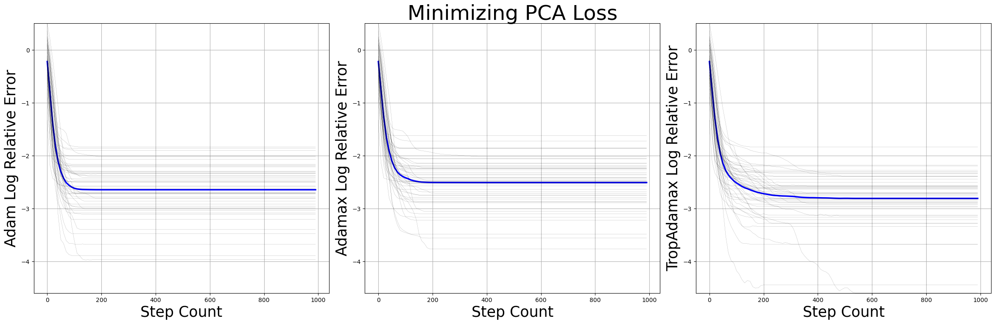

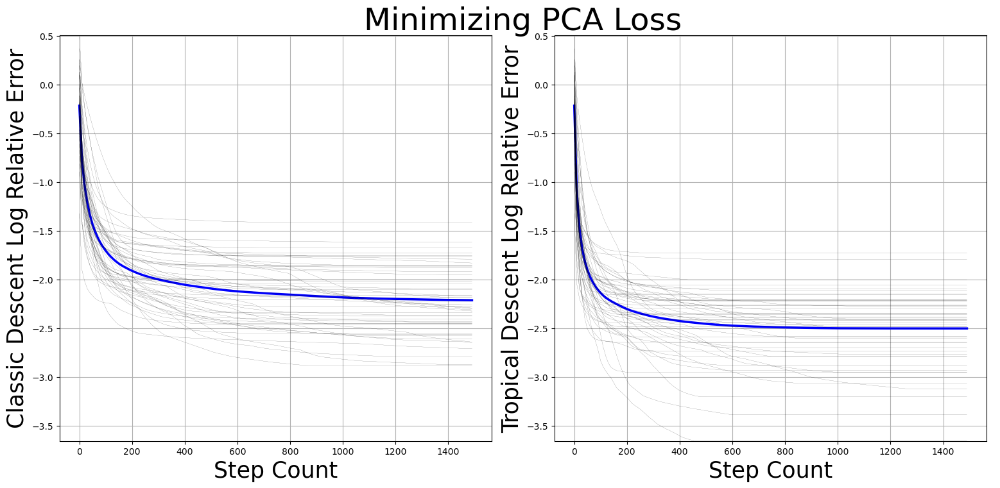

In [74]:
Stats_Prob = "PCA"
Adam_num_steps = 1000
Descent_num_steps = 1500
plotting(PCA_loss_values[:, 2:], PCA_global_solution, Adam_num_steps)
plotting(PCA_loss_values[:, :2], PCA_global_solution, Descent_num_steps, grad_types = ["Classic Descent", "Tropical Descent"], save_name = "Descent")

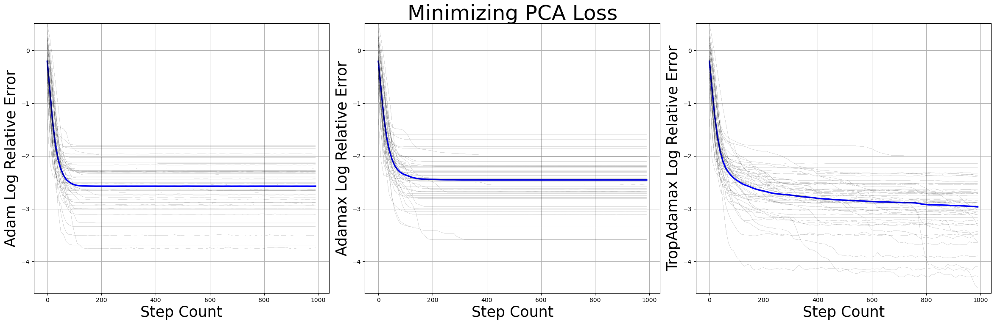

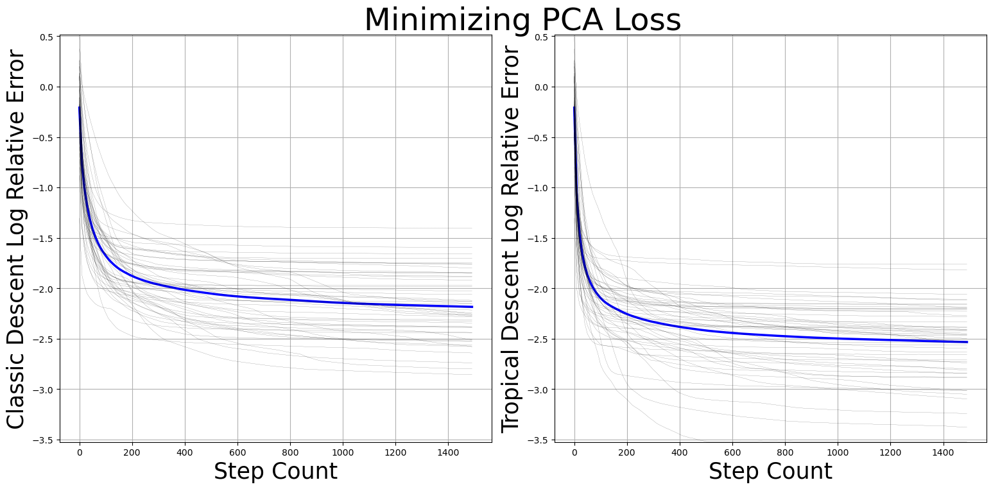

In [88]:
Stats_Prob = "PCA"
Adam_num_steps = 1000
Descent_num_steps = 1500
plotting(PCA_loss_values_uncut[:, 2:], PCA_global_solution_uncut, Adam_num_steps)
plotting(PCA_loss_values_uncut[:, :2], PCA_global_solution_uncut, Descent_num_steps, grad_types = ["Classic Descent", "Tropical Descent"], save_name = "Descent")

## Tropical Logistic Regression

In [108]:
#Setting hyperparameters, generating and plotting data
random.seed(2023)
np.random.seed(2023)
torch.manual_seed(2023)

Stats_Prob = "LogR"
num_exps = 50 # number of experiments
n = 50 # number of data
N = 10 # input dimension
Adam_lr = 0.5
Descent_lr = 5
beta = (0.9,0.999)
Adam_num_steps = 300
Descent_num_steps = 400
tol_loss = 1e-4
tol_t = 1e-5
t_dim = 2*N
def step_size(i, norm):
    return norm /torch.sqrt(torch.tensor(i+1))

X = torch.concat((torch.randn(n,N)+torch.rand(N)*10, torch.randn(n,N)+torch.rand(N)*10))
Y = torch.tensor([1]*n + [0]*n, dtype = torch.double)
l0 = torch.tensor([1]).float()
l1 = torch.tensor([1]).float()

def LogR_objective(X, Y, w0, l0, w1, l1):

    n = len(X)
    d = len(w0)

    h = torch.empty([n])
    f = torch.empty([n])

    for k in range(n):

        h[k] = l0*trop_dist_1d(X[k],w0)- l1*trop_dist_1d(X[k],w1)+ (d-1)*torch.log(l1/l0)

        f[k] = Y[k]*torch.log(1/(1+torch.exp(-h[k])))+ (1-Y[k])*torch.log(1/(1+torch.exp(h[k])))

    return torch.sum(f)/n

def loss_fn(t):

    return -LogR_objective(X,Y,t[:N],l0,t[N:],l1)

In [127]:
# Calculating p=2 objective
tic = time.time()
LogR_loss_values, LogR_t_values, LogR_steps, LogR_global_solution, LogR_approx_optimum = run_experiments(loss_fn, 
                                                                                                         t_dim, 
                                                                                                         "LogR", 
                                                                                                         grad_types = ["L2", "T1", "Adam", "Adamax", "TropAdamax"])

print(time.time() - tic)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
SD ran
mean steps:  [83.62 96.44 60.64 57.26 79.26]
std steps:  [ 80.70932784 102.57702667  18.7699334   21.37925162  58.45949367]
convergence count:  [49. 49. 50. 50. 50.]
success count:  [0 0 1 2 1]
0.0011515786172822118
879.6480236053467


In [109]:
# Calculating p=2 objective
tic = time.time()
LogR_loss_values_uncut, LogR_t_values_uncut, LogR_steps_uncut, LogR_global_solution_uncut, LogR_approx_optimum_uncut = run_experiments(loss_fn, 
                                                                                                         t_dim, 
                                                                                                         "LogR", 
                                                                                                         grad_types = ["L2", "T1", "Adam", "Adamax", "TropAdamax"],
                                                                                                         termination = False)

print(time.time() - tic)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
SD ran
mean steps:  [400. 400. 300. 300. 300.]
std steps:  [0. 0. 0. 0. 0.]
convergence count:  [0. 0. 0. 0. 0.]
success count:  [0 0 3 3 1]
0.0009614556911401451
3458.672770500183


In [178]:
np.save("LogR/loss_values",np.asarray(LogR_loss_values))
np.save("LogR/t_values",np.asarray(LogR_t_values))
np.save("LogR/steps",np.asarray(LogR_steps))
np.save("LogR/global_solution",np.asarray(LogR_global_solution))
np.save("LogR/approx_optimum",np.asarray(LogR_approx_optimum))

In [110]:
np.save("LogR/loss_values_uncut",np.asarray(LogR_loss_values_uncut))
np.save("LogR/t_values_uncut",np.asarray(LogR_t_values_uncut))
np.save("LogR/steps_uncut",np.asarray(LogR_steps_uncut))
np.save("LogR/global_solution_uncut",np.asarray(LogR_global_solution_uncut))
np.save("LogR/approx_optimum_uncut",np.asarray(LogR_approx_optimum_uncut))

In [75]:
LogR_loss_values = np.load("LogR/loss_values.npy")
LogR_t_values = np.load("LogR/t_values.npy")
LogR_steps = np.load("LogR/steps.npy")
LogR_global_solution = np.load("LogR/global_solution.npy")
LogR_approx_optimum = np.load("LogR/approx_optimum.npy")

In [89]:
LogR_loss_values_uncut = np.load("LogR/loss_values_uncut.npy")
LogR_t_values_uncut = np.load("LogR/t_values_uncut.npy")
LogR_steps_uncut = np.load("LogR/steps_uncut.npy")
LogR_global_solution_uncut = np.load("LogR/global_solution_uncut.npy")
LogR_approx_optimum_uncut = np.load("LogR/approx_optimum_uncut.npy")

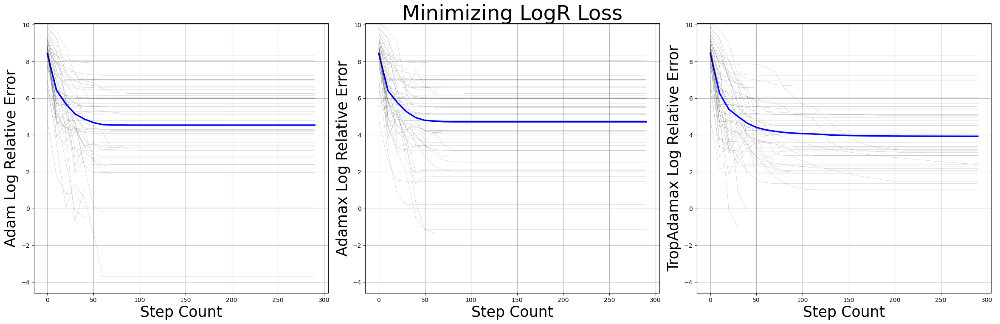

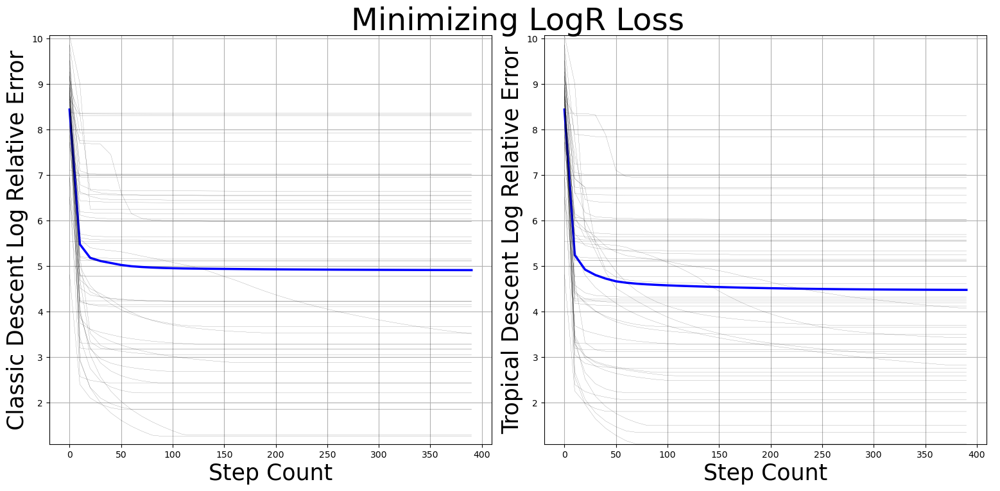

In [76]:
Stats_Prob = "LogR"
Adam_num_steps = 300
Descent_num_steps = 400
plotting(LogR_loss_values[:,2:], LogR_global_solution, Adam_num_steps)
plotting(LogR_loss_values[:,:2], LogR_global_solution, Descent_num_steps, grad_types = ["Classic Descent", "Tropical Descent"], save_name = "Descent")

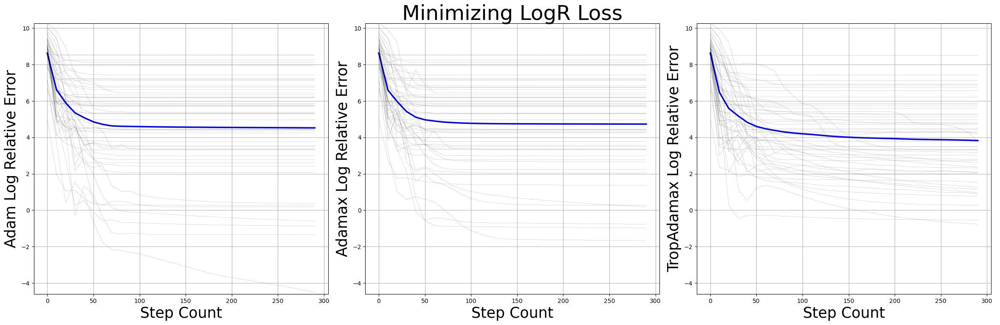

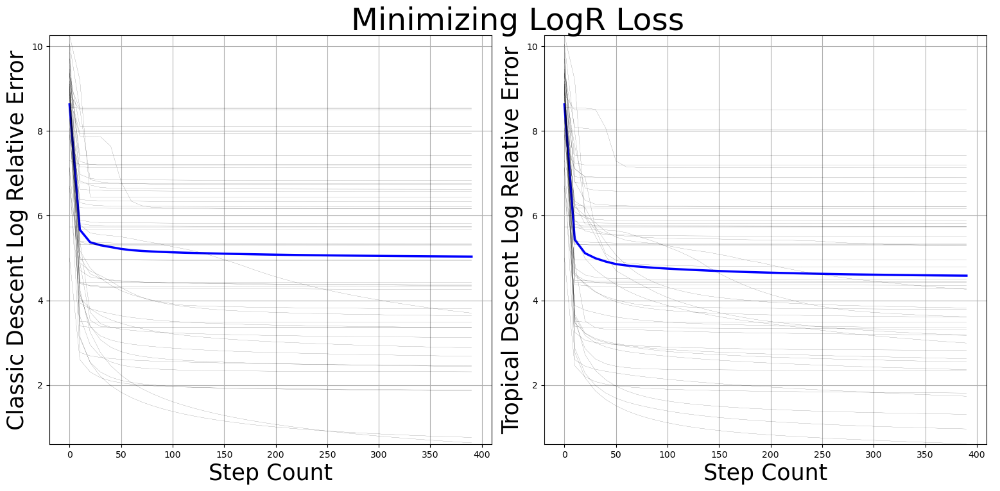

In [90]:
Stats_Prob = "LogR"
Adam_num_steps = 300
Descent_num_steps = 400
plotting(LogR_loss_values_uncut[:,2:], LogR_global_solution_uncut, Adam_num_steps)
plotting(LogR_loss_values_uncut[:,:2], LogR_global_solution_uncut, Descent_num_steps, grad_types = ["Classic Descent", "Tropical Descent"], save_name = "Descent")

## Tropical Linear Regression

In [103]:
#Setting hyperparameters, generating and plotting data
random.seed(2023)
np.random.seed(2023)
torch.manual_seed(2023)

Stats_Prob = "LR"
num_exps = 50 # number of experiments
n = 50 # number of data
N = 10 # input dimension
Adam_lr = 0.5
Descent_lr = 5
beta = (0.9,0.999)
Adam_num_steps = 1500
Descent_num_steps = 2000
tol_loss = 5e-4
tol_t = 1e-5
t_dim = N
def step_size(i, norm):
    return norm /torch.sqrt(torch.tensor(i+1))

X = torch.randn(n,N)*10
true_beta = torch.randn(N)

def LR_objective(beta, X):

    n = len(X)
    
    v = torch.topk(X - beta,2).values
    
    return torch.max(v[:,0] - v[:,1])

def loss_fn(t):
    return LR_objective(torch.flatten(-t), X)

In [66]:
# Calculating p=2 objective
tic = time.time()
LR_loss_values, LR_t_values, LR_steps, LR_global_solution, LR_approx_optimum = run_experiments(loss_fn, 
                                                                                               t_dim, 
                                                                                               "LR", 
                                                                                               grad_types = ["L2", "T1", "Adam", "Adamax", "TropAdamax"])

print(time.time() - tic)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
SD ran
mean steps:  [1649.76  402.18  677.68  989.24  575.64]
std steps:  [700.75709229 327.78887657 626.48059635 662.68953696 431.56912587]
convergence count:  [11. 50. 33. 19. 45.]
success count:  [0 0 0 0 0]
7.154831951209218
56.079697608947754


In [104]:
# Calculating p=2 objective
tic = time.time()
LR_loss_values_uncut, LR_t_values_uncut, LR_steps_uncut, LR_global_solution_uncut, LR_approx_optimum_uncut = run_experiments(loss_fn, 
                                                                                               t_dim, 
                                                                                               "LR", 
                                                                                               grad_types = ["L2", "T1", "Adam", "Adamax", "TropAdamax"],
                                                                                              termination = False)

print(time.time() - tic)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
SD ran
mean steps:  [2000. 2000. 1500. 1500. 1500.]
std steps:  [0. 0. 0. 0. 0.]
convergence count:  [0. 0. 0. 0. 0.]
success count:  [0 5 0 0 0]
7.154703758355481
103.30908536911011


In [179]:
np.save("LR/loss_values",np.asarray(LR_loss_values))
np.save("LR/t_values",np.asarray(LR_t_values))
np.save("LR/steps",np.asarray(LR_steps))
np.save("LR/global_solution",np.asarray(LR_global_solution))
np.save("LR/approx_optimum",np.asarray(LR_approx_optimum))

In [105]:
np.save("LR/loss_values_uncut",np.asarray(LR_loss_values_uncut))
np.save("LR/t_values_uncut",np.asarray(LR_t_values_uncut))
np.save("LR/steps_uncut",np.asarray(LR_steps_uncut))
np.save("LR/global_solution_uncut",np.asarray(LR_global_solution_uncut))
np.save("LR/approx_optimum_uncut",np.asarray(LR_approx_optimum_uncut))

In [77]:
LR_loss_values = np.load("LR/loss_values.npy")
LR_t_values = np.load("LR/t_values.npy")
LR_steps = np.load("LR/steps.npy")
LR_global_solution = np.load("LR/global_solution.npy")
LR_approx_optimum = np.load("LR/approx_optimum.npy")

In [91]:
LR_loss_values_uncut = np.load("LR/loss_values_uncut.npy")
LR_t_values_uncut = np.load("LR/t_values_uncut.npy")
LR_steps_uncut = np.load("LR/steps_uncut.npy")
LR_global_solution_uncut = np.load("LR/global_solution_uncut.npy")
LR_approx_optimum_uncut = np.load("LR/approx_optimum_uncut.npy")

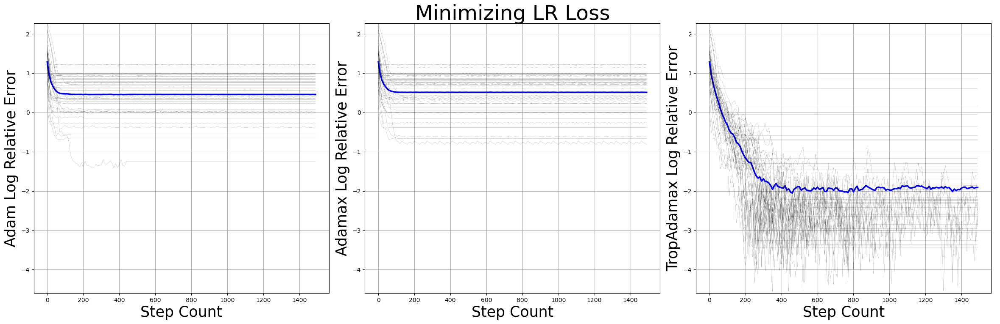

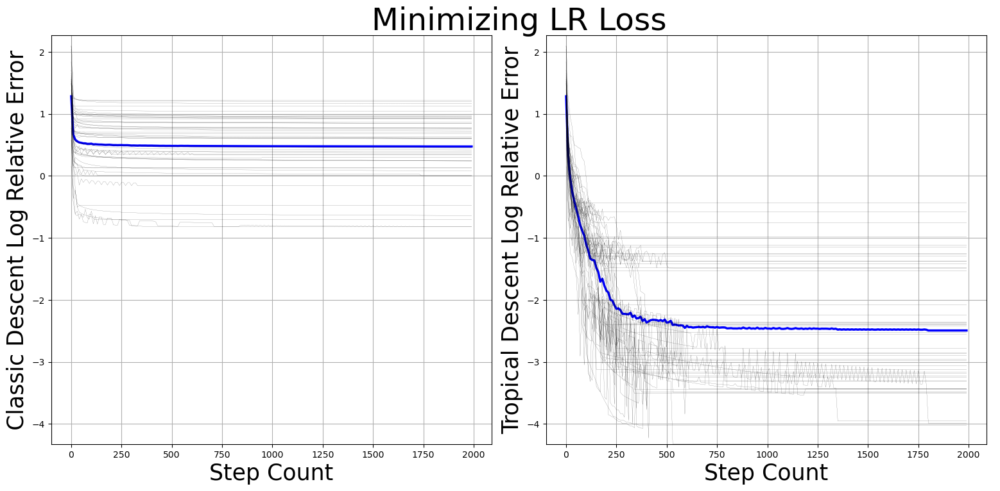

In [78]:
Stats_Prob = "LR"
Adam_num_steps = 1500
Descent_num_steps = 2000
plotting(np.asarray(LR_loss_values)[:,2:], LR_global_solution, Adam_num_steps)
plotting(np.asarray(LR_loss_values)[:,:2], LR_global_solution, Descent_num_steps, grad_types = ["Classic Descent", "Tropical Descent"], save_name = "Descent")

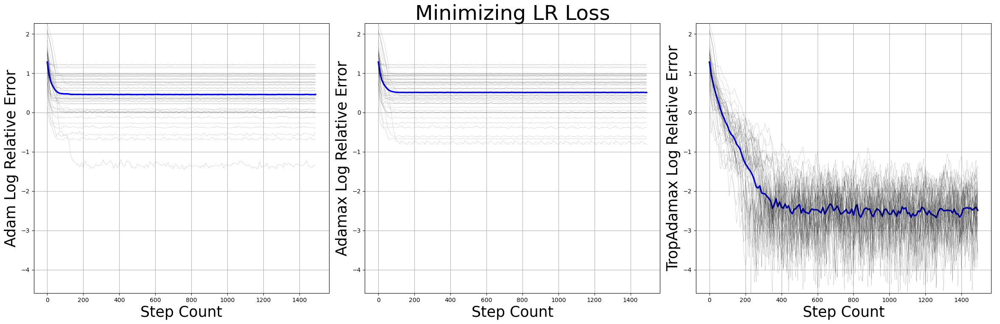

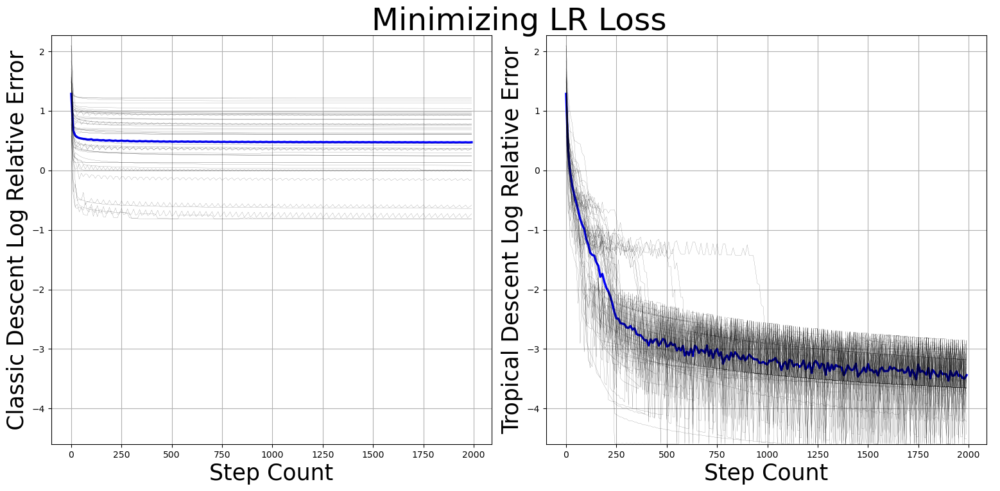

In [92]:
Stats_Prob = "LR"
Adam_num_steps = 1500
Descent_num_steps = 2000
plotting(np.asarray(LR_loss_values_uncut)[:,2:], LR_global_solution_uncut, Adam_num_steps)
plotting(np.asarray(LR_loss_values_uncut)[:,:2], LR_global_solution_uncut, Descent_num_steps, grad_types = ["Classic Descent", "Tropical Descent"], save_name = "Descent")